<a href="https://colab.research.google.com/github/Avalon-DeNecochea/MentalhealthWeather/blob/main/Depression_Weather.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Weather and Mental Health Analysis**

Avalon DeNecochea and Fidel Figueroa

In [61]:
# libraries
import pandas as pd  
import json 
from urllib.request import urlopen 
import matplotlib.pyplot as plt 
import seaborn as sns
import scipy.stats as stats
import numpy as np
!pip install us
import us
with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)
import plotly.express as px

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


*WEATHER DATA SOURCES:*



* Average temperature by U.S. county (2019)
  https://www.ncei.noaa.gov/access/monitoring/climate-at-a-glance/county/mapping/110/tavg/201912/12/value



* Total precipitation by U.S. county (2019)
  https://www.ncei.noaa.gov/access/monitoring/climate-at-a-glance/county/mapping/110/pcp/201912/12/value


*MENTAL HEALTH DATA SOURCES:*


* Data
  
  https://www.countyhealthrankings.org/explore-health-rankings/rankings-data-documentation

*   About dataset

  https://www.countyhealthrankings.org/explore-health-rankings/county-health-rankings-model/health-outcomes/quality-of-life/poor-mental-health-days?year=2022

##**Hypothesis**

For this analysis, we explore the relationship between mental health and weather by county in the United States. All data is from the year 2019. This year was selected because it features nearly complete data from both sources and controls for possible mental health effects of the COVID-19 pandemic, which had the most impact in the U.S. starting in 2020. 

To represent weather, we use total precipitation (inches) and average temperature (Farenheit) over the course of 2019. This data was gathered from the National Oceanic and Atmospheric Association (NOAA) site. 

To represent mental health, we used survey data from the University of Wisconsin Population Health Institute. The metric used is percentage of adults residing in the given county experiencing "Frequent Mental Distress" defined as "percentage of adults reporting 14 or more days of poor mental health per month".

**We hypothesized people experiencing higher levels of frequent mental distress live in counties with lower average temperatures and higher total precipitation.**

##**Data cleaning**

Load package to match up state names, abbreviations, and FIPS codes

In [62]:
#use US states package for FIPS codes
states = us.states.mapping('fips', 'abbr')

#reshape
states_df = pd.DataFrame(data = states, index = [0])
states_df = states_df.transpose()
states_df = states_df.reset_index()
states_df.rename(columns={'index':'Code', 0:'State'}, inplace=True)

states_df

,Code,State
0,01,AL
1,02,AK
2,04,AZ
3,05,AR
4,06,CA
5,08,CO
6,09,CT
7,10,DE
8,12,FL
9,13,GA


In [63]:
#use US states package for state name -> abbreviation
state_name = us.states.mapping('name', 'abbr')

#reshape
state_name_df = pd.DataFrame(data = state_name, index = [0])
state_name_df = state_name_df.transpose()
state_name_df = state_name_df.reset_index()
state_name_df.rename(columns={'index':'State', 0:'Abbr'}, inplace=True)

state_name_df

,State,Abbr
0,Alabama,AL
1,Alaska,AK
2,Arizona,AZ
3,Arkansas,AR
4,California,CA
5,Colorado,CO
6,Connecticut,CT
7,Delaware,DE
8,Florida,FL
9,Georgia,GA


In [64]:
#import frequent mental distress data

mh_link = 'https://github.com/Avalon-DeNecochea/MentalhealthWeather/blob/main/%25FrequentMentalDistress2019.csv?raw=true'

mh_df = pd.read_csv(mh_link)

mh_df.head()

/usr/local/lib/python3.8/dist-packages/IPython/core/interactiveshell.py:3326: DtypeWarning:

Columns (0,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,252,253,254,255,

,Unnamed: 0,Unnamed: 1,Unnamed: 2,COVID-19 age-adjusted mortality,Unnamed: 4,Life expectancy,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,...,Unnamed: 279,% non-Hispanic white,Unnamed: 281,% not proficient in English,Unnamed: 283,Unnamed: 284,Unnamed: 285,% female,% rural,Unnamed: 288
0,FIPS,State,County,# deaths due to COVID-19 during 2020,COVID-19 death rate,Life Expectancy,95% CI - Low,95% CI - High,Life Expectancy (AIAN),Life Expectancy (AIAN) 95% CI - Low,...,% Hispanic,# Non-Hispanic white,% Non-Hispanic white,# Not Proficient in English,% Not Proficient in English,95% CI - Low,95% CI - High,% female,# rural residents,% rural
1,01000,Alabama,NaN,6544,104,74.8,74.8,74.9,111.8,99.3,...,4.6,3205777,65.1,46887,1,1,1,51.7,1957932,41.0
2,01001,Alabama,Autauga,55,82,76.6,75.8,77.3,NaN,NaN,...,3.1,41079,73.2,363,1,0,1,51.5,22921,42.0
3,01003,Alabama,Baldwin,165,50,77.7,77.3,78.1,104.6,67.6,...,4.6,191015,83.3,1593,1,0,1,51.6,77060,42.3
4,01005,Alabama,Barbour,38,110,72.9,71.6,74.1,NaN,NaN,...,4.7,11130,45.3,433,2,1,3,47.2,18613,67.8


In [65]:
# clean frequent mental distress data

#fix column names
mh_df.columns = mh_df.iloc[0]
mh_df1 = mh_df.drop(mh_df.index[0])

# merge state abbreviations
mh_df1 = pd.merge(mh_df1, state_name_df, on=["State"])

#select relevant columns
mh_df1 = mh_df1[["FIPS", "Abbr", "County", "% Frequent Mental Distress"]]
mh_df1.rename(columns={'Abbr':'State'}, inplace=True)


#remove state aggregates/labels/null counties
mh_df1 = mh_df1[mh_df1['County'].notna()]

mh_df1['FIPS'] = mh_df1['FIPS'].values.astype('str')

mh_df1['FIPS'] = mh_df1['FIPS'].str.strip()

mh_df1

#mh_df1
# add "county"
#mh_df1['County'] = mh_df1['County'].astype(str) + ' County'

/usr/local/lib/python3.8/dist-packages/pandas/core/frame.py:5039: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,FIPS,State,County,% Frequent Mental Distress
1,01001,AL,Autauga,17
2,01003,AL,Baldwin,16
3,01005,AL,Barbour,21
4,01007,AL,Bibb,19
5,01009,AL,Blount,18
...,...,...,...,...
3188,56037,WY,Sweetwater,13
3189,56039,WY,Teton,11
3190,56041,WY,Uinta,14
3191,56043,WY,Washakie,13


In [66]:
# import county avg temp data
temp_link = 'https://github.com/Avalon-DeNecochea/MentalhealthWeather/raw/main/CountyAvgTemp2019.csv'

temp_df = pd.read_csv(temp_link)

temp_df.head()

,Location ID,Location,Value,Rank,Anomaly (1901-2000 base period),1901-2000 Mean
0,AL-001,Autauga County,66.7,128,2.8,63.9
1,AL-003,Baldwin County,68.8,125,2.1,66.7
2,AL-005,Barbour County,66.9,125,2.2,64.7
3,AL-007,Bibb County,64.9,124,2.1,62.8
4,AL-009,Blount County,63.6,126,3.0,60.6


In [67]:
#clean Location ID to match FIPS for joining

temp_df[['State', 'ID']] = temp_df['Location ID'].str.split('-', 1, expand=True)

temp_df1 = pd.merge(temp_df, states_df, on=["State"])

temp_df1["FIPS"] = temp_df1[['Code', 'ID']].agg(''.join, axis=1)

temp_df1.rename(columns={'Value':'Average Temperature', 'Rank':'Average Temperature Ranking', 'Location':'County'}, inplace=True)

temp_df1 = temp_df1[["FIPS", "County", "State", "Average Temperature", "Average Temperature Ranking"]]

temp_df1.head()

#temp_df1[temp_df1.isna().any(axis=1)]

,FIPS,County,State,Average Temperature,Average Temperature Ranking
0,01001,Autauga County,AL,66.7,128
1,01003,Baldwin County,AL,68.8,125
2,01005,Barbour County,AL,66.9,125
3,01007,Bibb County,AL,64.9,124
4,01009,Blount County,AL,63.6,126


In [68]:
# import county precipitation data

prec_link = 'https://github.com/Avalon-DeNecochea/MentalhealthWeather/raw/main/CountyPrecipitation2019.csv'

prec_df = pd.read_csv(prec_link)

prec_df.head()

,Location ID,Location,Value,Rank,Anomaly (1901-2000 base period),1901-2000 Mean
0,AL-001,Autauga County,47.63,30,-5.87,53.50
1,AL-003,Baldwin County,55.61,34,-6.28,61.89
2,AL-005,Barbour County,44.59,25,-7.71,52.30
3,AL-007,Bibb County,52.44,50,-2.73,55.17
4,AL-009,Blount County,64.60,106,9.09,55.51


In [69]:
#clean Location ID to match FIPS for joining

prec_df[['State', 'ID']] = prec_df['Location ID'].str.split('-', 1, expand=True)

prec_df1 = pd.merge(prec_df, states_df, on=["State"])

prec_df1["FIPS"] = prec_df1[['Code', 'ID']].agg(''.join, axis=1)

prec_df1.rename(columns={'Value':'Total Precipitation', 'Rank':'Total Precipitation Ranking', 'Location':'County'}, inplace=True)

prec_df1 = prec_df1[["FIPS", "County", "State", "Total Precipitation", "Total Precipitation Ranking"]]

prec_df1

#prec_df1[prec_df1.isna().any(axis=1)]

,FIPS,County,State,Total Precipitation,Total Precipitation Ranking
0,01001,Autauga County,AL,47.63,30
1,01003,Baldwin County,AL,55.61,34
2,01005,Barbour County,AL,44.59,25
3,01007,Bibb County,AL,52.44,50
4,01009,Blount County,AL,64.60,106
...,...,...,...,...,...
3132,02230,Skagway Municipality,AK,68.02,27
3133,02240,Southeast Fairbanks Census Area,AK,20.82,77
3134,02275,Wrangell City and Borough,AK,125.30,13
3135,02282,Yakutat City and Borough,AK,156.80,4


In [70]:
# Merge weather tables
weather_df = pd.merge(prec_df1, temp_df1, on=["State", "County", "FIPS"])

weather_df

,FIPS,County,State,Total Precipitation,Total Precipitation Ranking,Average Temperature,Average Temperature Ranking
0,01001,Autauga County,AL,47.63,30,66.7,128
1,01003,Baldwin County,AL,55.61,34,68.8,125
2,01005,Barbour County,AL,44.59,25,66.9,125
3,01007,Bibb County,AL,52.44,50,64.9,124
4,01009,Blount County,AL,64.60,106,63.6,126
...,...,...,...,...,...,...,...
3132,02230,Skagway Municipality,AK,68.02,27,33.0,95
3133,02240,Southeast Fairbanks Census Area,AK,20.82,77,28.8,97
3134,02275,Wrangell City and Borough,AK,125.30,13,41.0,84
3135,02282,Yakutat City and Borough,AK,156.80,4,36.4,98


Complete dataframe

In [71]:
# merge with mental health data

all_df = mh_df1.merge(weather_df, on=['FIPS', 'State'], how = "left")

all_df['% Frequent Mental Distress'] = pd.to_numeric(all_df['% Frequent Mental Distress'])
all_df['County'] = all_df['County_y']
all_df = all_df[['FIPS', 'County', 'State', '% Frequent Mental Distress', 'Total Precipitation', 'Average Temperature', 'Total Precipitation Ranking', 'Average Temperature Ranking']]

all_df
#all_df[all_df.isna().any(axis=1)]

,FIPS,County,State,% Frequent Mental Distress,Total Precipitation,Average Temperature,Total Precipitation Ranking,Average Temperature Ranking
0,01001,Autauga County,AL,17,47.63,66.7,30.0,128.0
1,01003,Baldwin County,AL,16,55.61,68.8,34.0,125.0
2,01005,Barbour County,AL,21,44.59,66.9,25.0,125.0
3,01007,Bibb County,AL,19,52.44,64.9,50.0,124.0
4,01009,Blount County,AL,18,64.60,63.6,106.0,126.0
...,...,...,...,...,...,...,...,...
3137,56037,Sweetwater County,WY,13,10.76,40.0,98.0,37.0
3138,56039,Teton County,WY,11,36.87,34.4,90.0,54.0
3139,56041,Uinta County,WY,14,14.66,38.1,107.0,30.0
3140,56043,Washakie County,WY,13,16.55,42.5,120.0,33.0


In [72]:
#all_df.to_csv("mental_distress_weather.csv")

##**Visualizations**


## % Frequent Mental Distress vs Total Precipitation

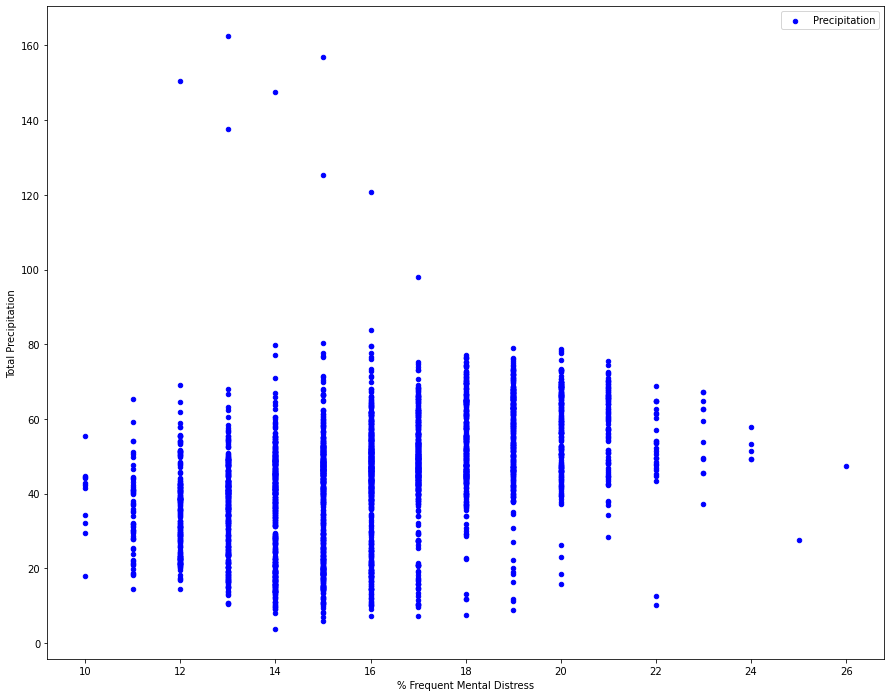

In [73]:
##Scatterplot
fig, ax = plt.subplots(figsize=(15, 12))
all_df.plot.scatter(x='% Frequent Mental Distress', y='Total Precipitation', c='blue',label='Precipitation', ax=ax)



plt.legend()
plt.show()

When looking at this visual we can see a slight association with higher precipitation and % Frequent Mental Distress.

### % Frequent Mental Distress vs Average Temparature





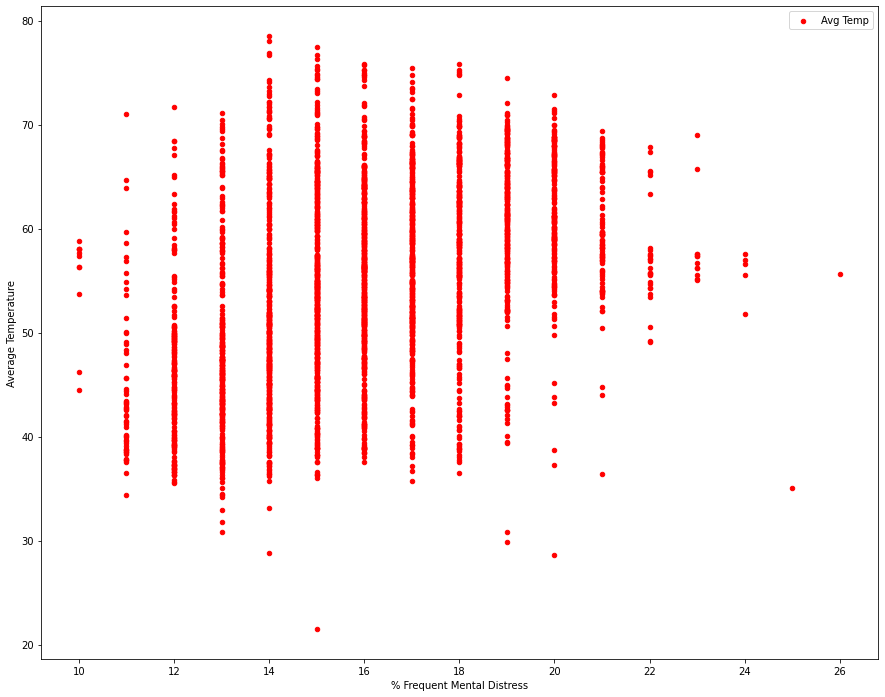

In [74]:
## Scatterplot
fig, ax = plt.subplots(figsize=(15, 12))
all_df.plot.scatter(x='% Frequent Mental Distress', y='Average Temperature', c='red',label='Avg Temp', ax=ax)
   

plt.legend()
plt.show()

For our second scatterplot we notice that% Frequent Mental Distress varies over all temperatures.


###Average Temperature

In [75]:
fig = px.choropleth(all_df, geojson=counties, locations='FIPS', color='Average Temperature',
                           color_continuous_scale="icefire",
                           range_color=(25, 75),
                           scope="usa"
                          )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

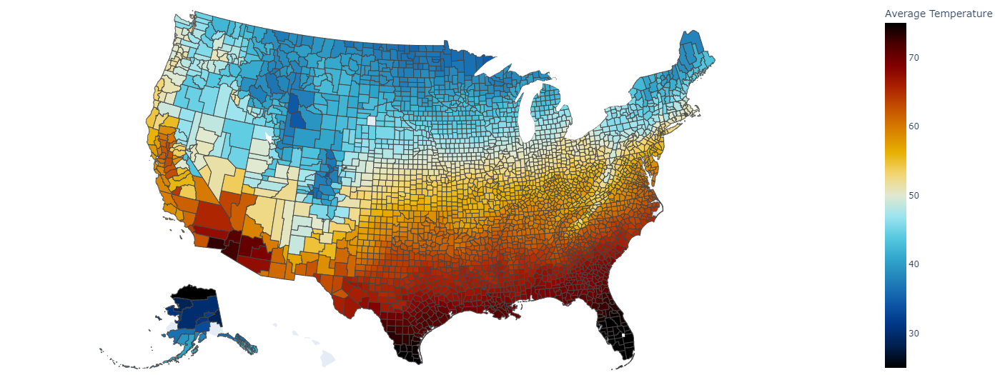

###Percent experiencing frequent mental distress

In [76]:
fig = px.choropleth(all_df, geojson=counties, locations='FIPS', color='% Frequent Mental Distress',
                           color_continuous_scale="Viridis",
                           range_color=(13, 21),
                           scope="usa"
                          )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

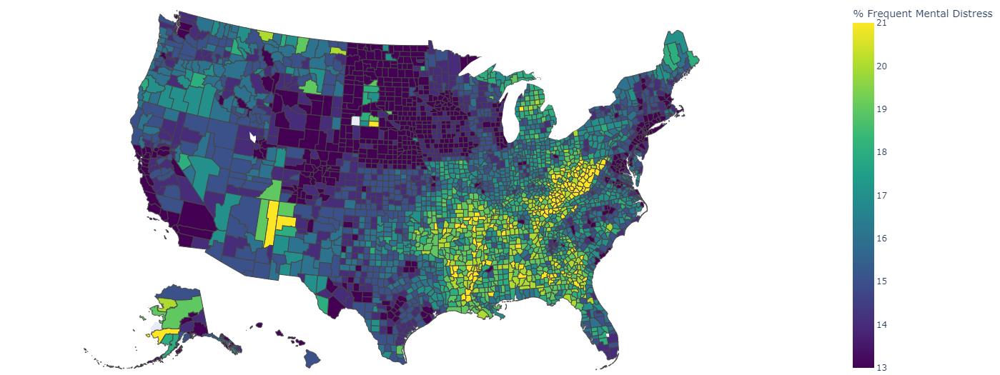

###Total Precipitation

In [77]:
fig = px.choropleth(all_df, geojson=counties, locations='FIPS', color='Total Precipitation',
                           color_continuous_scale="dense",
                           range_color=(8, 80),
                           scope="usa"
                          )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

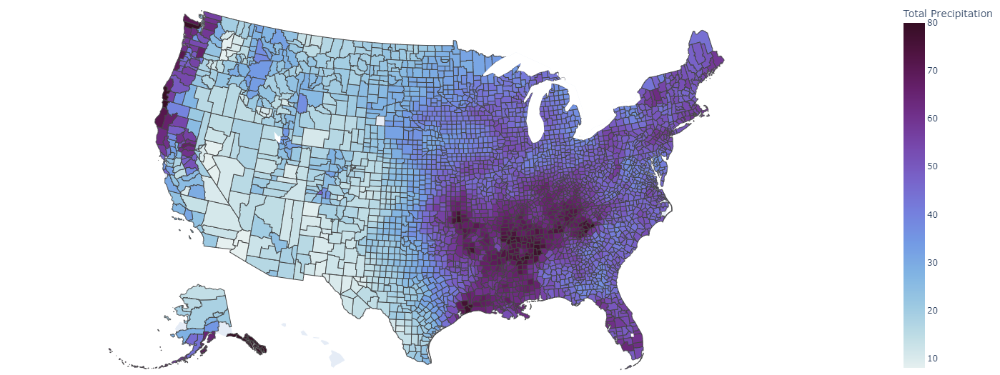

##**Investigating Outliers**

Below are summary statistics for percentage experiencing frequent mental distress, total precipitation, and average temperature to reference when comparing to high and low values. 

In [78]:
all_df[['% Frequent Mental Distress', 'Total Precipitation', 'Average Temperature']].describe()

,% Frequent Mental Distress,Total Precipitation,Average Temperature
count,3142.000000,3134.000000,3134.000000
mean,16.009230,44.376554,54.684237
std,2.580184,16.213092,9.351445
min,10.000000,3.760000,21.500000
25%,14.000000,34.957500,47.500000
50%,16.000000,45.975000,55.100000
75%,18.000000,54.247500,62.000000
max,26.000000,162.480000,78.500000


#### Highest percentage of frequent mental distress

In [79]:
#most frequent mental distress

mh_df_descending = all_df.sort_values("% Frequent Mental Distress", ascending=False)

desc= mh_df_descending[["County","State", "% Frequent Mental Distress", "Total Precipitation", "Average Temperature"]]

# top 10
print(desc.head(10))

                    County State  % Frequent Mental Distress  \
3015       McDowell County    WV                          26   
81    Kusilvak Census Area    AK                          25   
3021          Mingo County    WV                          24   
3042        Webster County    WV                          24   
3046        Wyoming County    WV                          24   
3014          Logan County    WV                          24   
2994          Boone County    WV                          24   
2998        Calhoun County    WV                          23   
418          Clinch County    GA                          23   
1057            Lee County    KY                          23   

      Total Precipitation  Average Temperature  
3015                47.54                 55.6  
81                  27.72                 35.1  
3021                53.19                 57.6  
3042                57.80                 51.8  
3046                49.18                 55.5  
3

All counties have above average precipitation levels except Kusilvak Census Area, AK and Clinch County, GA. All counties experienced moderate average temperatures except Kusilvak Census Area, AK. This is the only county below average temperatures with the very low average temperature of 35.1 degrees. 

####Lowest percentage of frequent mental distress

In [80]:
#least frequent mental distress

mh_df_ascending = all_df.sort_values("% Frequent Mental Distress", ascending=True)

asc= mh_df_ascending[["County","State", "% Frequent Mental Distress", "Total Precipitation", "Average Temperature"]]

# top 10
print(asc.head(10))

                    County State  % Frequent Mental Distress  \
1207     Montgomery County    MD                          10   
223   San Francisco County    CA                          10   
226       San Mateo County    CA                          10   
2826      Arlington County    VA                          10   
228     Santa Clara County    CA                          10   
2848        Fairfax County    VA                          10   
1791       Somerset County    NJ                          10   
262         Douglas County    CO                          10   
2925     Falls Church City    VA                          10   
2872        Loudoun County    VA                          10   

      Total Precipitation  Average Temperature  
1207                44.09                 56.3  
223                 29.56                 58.0  
226                 34.33                 58.0  
2826                44.36                 58.0  
228                 32.17                 58.8  
2

All counties had 10% of their population experiencing frequent mental distress, which is the minimum throughout the dataset. Most counties all experienced roughly average precipitation levels. Douglas County, CO had very low levels of precipitation and Somerset County, NJ had above average levels of precipitation. All counties had fairly moderate average temperatures. 

####Least precipitation

In [81]:
# least precipitation

prec_ascending = all_df.sort_values("Total Precipitation", ascending=True)

asc= prec_ascending[["County","State", "Total Precipitation", "% Frequent Mental Distress"]]

# top 10
print(asc.head(10))

                County State  Total Precipitation  % Frequent Mental Distress
198    Imperial County    CA                 3.76                          14
110        Yuma County    AZ                 6.04                          15
2965      Grant County    WA                 7.00                          15
1751  Esmeralda County    NV                 7.16                          16
102      La Paz County    AZ                 7.27                          17
1757    Mineral County    NV                 7.52                          18
2955     Benton County    WA                 8.12                          14
1747  Churchill County    NV                 8.14                          15
2673     Loving County    TX                 8.29                          15
1819   San Juan County    NM                 8.85                          19


The counties with the least precipitation have mostly below average mental distress, except for a couple slightly above average. 

####Most precipitation

In [82]:
# most precipitation

prec_descending = all_df.sort_values("Total Precipitation", ascending=False)

desc= prec_descending[["County","State", "Total Precipitation", "% Frequent Mental Distress"]]

# top 10
print(desc.head(10))

                                 County State  Total Precipitation  \
87                   Petersburg Borough    AK               162.48   
94             Yakutat City and Borough    AK               156.80   
77              Juneau City and Borough    AK               150.36   
79            Ketchikan Gateway Borough    AK               147.64   
89               Sitka City and Borough    AK               137.70   
93            Wrangell City and Borough    AK               125.30   
76            Hoonah-Angoon Census Area    AK               120.68   
88    Prince of Wales-Hyder Census Area    AK                98.05   
2215                       Curry County    OR                83.78   
1977                Transylvania County    NC                80.25   

      % Frequent Mental Distress  
87                            13  
94                            15  
77                            12  
79                            14  
89                            13  
93                 

Almost all of the counties with heavy precipitation are located in Alaska. Surprisingly, these counties also appear to have average and low levels of mental distress. 

####Lowest average temperature

In [83]:
# coldest counties

temp_ascending = all_df.sort_values("Average Temperature", ascending=True)

asc= temp_ascending[["County","State", "Average Temperature", "% Frequent Mental Distress"]]

# top 10
print(asc.head(10))

                              County State  Average Temperature  \
85               North Slope Borough    AK                 21.5   
86          Northwest Arctic Borough    AK                 28.6   
91   Southeast Fairbanks Census Area    AK                 28.8   
95         Yukon-Koyukuk Census Area    AK                 29.9   
72                    Denali Borough    AK                 30.8   
84                  Nome Census Area    AK                 30.8   
74      Fairbanks North Star Borough    AK                 31.8   
90              Skagway Municipality    AK                 33.0   
83         Matanuska-Susitna Borough    AK                 33.1   
277                      Lake County    CO                 34.2   

     % Frequent Mental Distress  
85                           15  
86                           20  
91                           14  
95                           19  
72                           13  
84                           19  
74                      

The top 9 coldest counties in the US are in Alaska. However, there is a spread of the levels of frequent mental distress, with only 3 of these counties experiencing very high levels; Northwest Arctic Borough, Yukon-Koyukuk Census Area, and Nome Census Area. 

####Highest average temperature

In [84]:
# hottest counties

temp_descending = all_df.sort_values("Average Temperature", ascending=False)

asc= temp_descending[["County","State", "Average Temperature", "% Frequent Mental Distress"]]

# top 10
print(asc.head(10))

                County State  Average Temperature  % Frequent Mental Distress
363      Monroe County    FL                 78.5                          14
362  Miami-Dade County    FL                 78.0                          14
325     Broward County    FL                 77.5                          15
369  Palm Beach County    FL                 76.9                          14
361      Martin County    FL                 76.7                          15
330     Collier County    FL                 76.7                          14
354         Lee County    FL                 76.3                          15
327   Charlotte County    FL                 75.8                          16
344      Hendry County    FL                 75.8                          18
375   St. Lucie County    FL                 75.7                          16


It is interesting to note that all of the counties with the highest average temperatures are in Florida. All of these counties have average or below levels of frequent mental distress, except for Hendry County.

##**Conclusion**

Ultimately, these graphs suggest a possible loose relationship between mental health and weather although it is difficult to determine for sure at this time.

*Note: The weather data excludes Hawaii, which we suspect may be an area that would support out hypothesis. We hope to find another data source for Hawaii weather data to use in the next phase of our analysis.*